In [1]:
using Plots
using StatsBase
using Base.Threads

# Lucas Schmidt Ferreira de Araujo

## Problem 01

In [2]:
function Segregation(nt::Int , L::Int , Nr::Int , Nb::Int , mt::Int , jr::Float64 , jb::Float64)
    N = Nr + Nb
    moves = 0
    domain = zeros(Int,nt,L,L)
    ind_pos = sample( [ [q,j] for q in 2:L-1 , j in 2:L-1 ] , N , replace=false)

    for q in 1:N
        q <= Nb ? domain[1, ind_pos[q][1] ,ind_pos[q][2] ] = 2 : domain[1, ind_pos[q][1] ,ind_pos[q][2] ] = 1
    end

    for q in 2:nt
        domain[q,:,:] = domain[q-1,:,:]
        for j in 2:L-1
            for k in 2:L-1
                ind = domain[q,j,k]
                if( ind != 0 )
                    neighbohrs = domain[q,j-mt:j+mt ,k-mt:k+mt]
                    total_neighbohrs = sum( neighbohrs .!= 0 )
                    same_neighbors = length( findall( x -> x == ind , neighbohrs ) )
                    ind == 1 ? jt = jr : jt = jb
                    if( total_neighbohrs > 0 && same_neighbors / total_neighbohrs <= jt ) 
                        new_x , new_y = rand(2:L-1 , 2)
                        while( domain[q, new_x , new_y ] != 0 )
                            new_x , new_y = rand(2:L-1 , 2)
                        end
                        domain[q,j,k] = 0
                        domain[q, new_x , new_y ] = ind
                    end
                end 
            end
        end
        if( domain[q,:,:] != domain[q-1,:,:] )
            moves += 1
        end
    end
    si = segregation_index( domain[end,:,:] , mt )
    return domain , moves , si
end

function Segregation_Torus(nt::Int , L::Int , Nr::Int , Nb::Int , mt::Int , jr::Float64 , jb::Float64)
    N = Nr + Nb
    domain = zeros(Int,nt,L,L)
    moves = 0
    ind_pos = sample( [ [q,j] for q in 1:L , j in 1:L ] , N , replace=false)
    for q in 1:N
        q <= Nb ? domain[1, ind_pos[q][1] ,ind_pos[q][2] ] = 2 : domain[1, ind_pos[q][1] ,ind_pos[q][2] ] = 1
    end

    for q in 2:nt
        domain[q,:,:] = domain[q-1,:,:]
        for j in 1:L
            for k in 1:L
                ind = domain[q,j,k]
                if( ind != 0 )
                    rows = mod1.(j-mt:j+mt, L)
                    cols = mod1.(k-mt:k+mt, L)
                    neighbohrs = domain[q,rows,cols]
                    total_neighbors = sum( neighbohrs .!= 0 )
                    same_neighbors = sum(neighbohrs .== ind)
                    ind == 1 ? jt = jr : jt = jb
                    if( total_neighbors > 0 && same_neighbors / total_neighbors <= jt ) 
                        new_x , new_y = rand(1:L , 2)
                        while( domain[q, new_x , new_y ] != 0 )
                            new_x , new_y = rand(1:L , 2)
                        end
                        domain[q,j,k] = 0
                        domain[q, new_x , new_y ] = ind
                    end
                end 
            end
        end
        if( domain[q,:,:] != domain[q-1,:,:] )
            moves += 1
        end
    end
    si = segregation_index( domain[end,:,:] , mt )
    return domain , moves , si
end

function segregation_index(final_state::Matrix{Int}, mt::Int)
    L = size(final_state, 2)
    total_similarity = 0.0
    agents = 0
    for x in 1:L, y in 1:L
        ind = final_state[x, y]
        if ind != 0
            rows = mod1.(x-mt:x+mt, L)
            cols = mod1.(y-mt:y+mt, L)
            neighbors = final_state[rows, cols]
            total_neighbors = sum(neighbors .!= 0)
            same_neighbors = sum(neighbors .== ind)
            if total_neighbors > 0
                total_similarity += same_neighbors / total_neighbors
                agents += 1
            end
        end
    end
    return total_similarity / agents
end


segregation_index (generic function with 1 method)

## Torus

┌ Info: Saved animation to /tmp/jl_liX0z6bQro.gif
└ @ Plots /home/lucas/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_liX0z6bQro.gif")
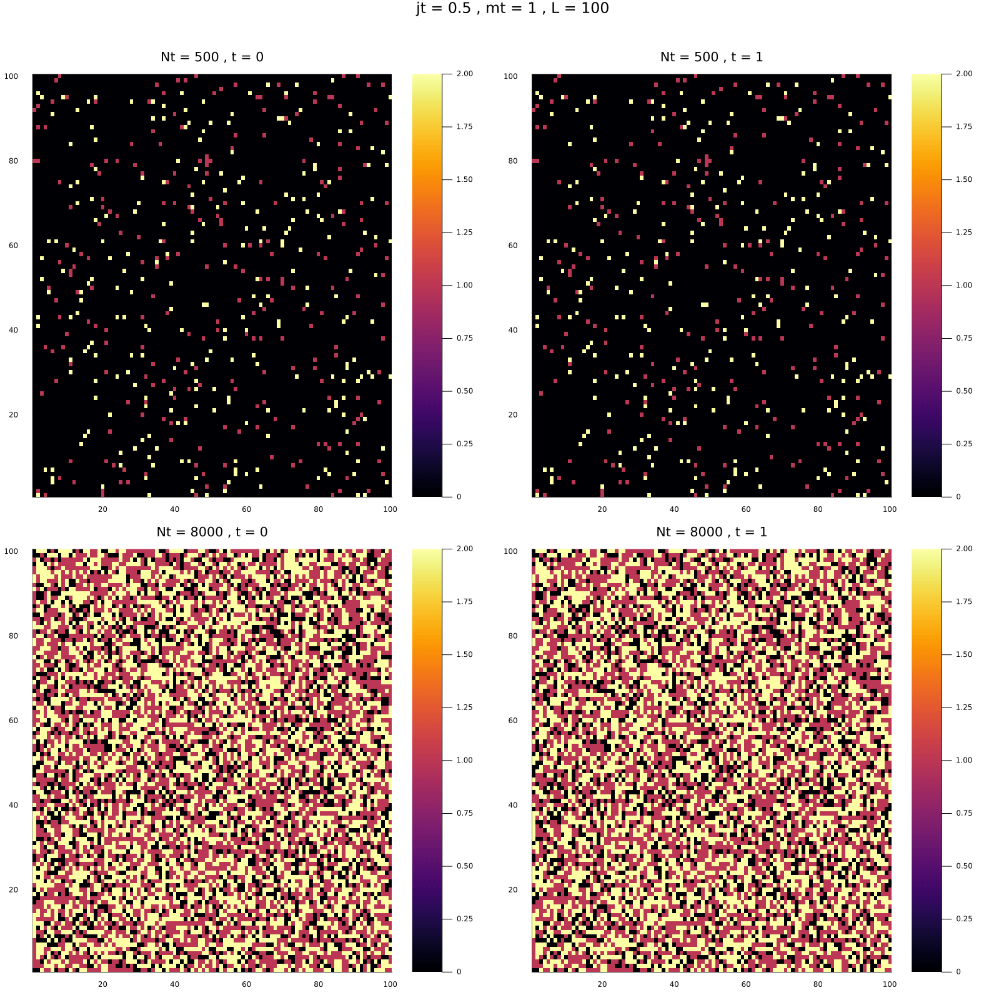

In [11]:
L  = 100
nt = 100
mt = 1
jr = jb = .5

domain1 , moves , si = Segregation_Torus(nt , L , 250 , 250 , mt , jr , jb)
domain2 , moves , si = Segregation_Torus(nt , L , 4000 , 4000 , mt , jr , jb)

fig = @animate for q in 1:nt
    p1 = heatmap( domain1[1,:,:] , title = "Nt = 500 , t = 0") #, color=cmap )
    p2 = heatmap( domain1[q,:,:] , title = "Nt = 500 , t = $(q)")  #, color=cmap )

    p3 = heatmap( domain2[1,:,:] , title = "Nt = 8000 , t = 0") #, color=cmap )
    p4 = heatmap( domain2[q,:,:] , title = "Nt = 8000 , t = $(q)")  #, color=cmap )
    plot(p1 , p2 , p3 , p4 , size = (1600 , 1600) , suptitle ="jt = $(jr) , mt = $(mt) , L = $(L)")
end
gif(fig)

In [3]:
L  = 100
nt = 100
mt = 1
jr = jb = .5

N = 250:4000
Si = zeros( length(N) )
Mv = zeros( length(N) )

Threads.@threads for q in eachindex(N)
    domain , moves , si = Segregation_Torus(nt , L , N[q] , N[q] , mt , jr , jb)
    Si[q] = si
    Mv[q] = moves
end;

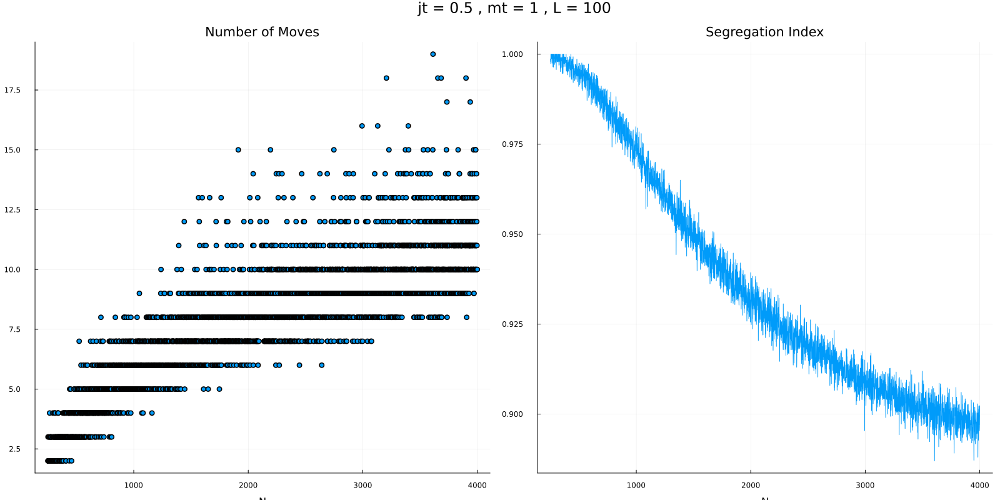

In [10]:
p1 = scatter(N , Mv , xlabel = "N" , legend = false , title = "Number of Moves")
p2 = plot(N , Si ,  xlabel = "N" , legend = false , title = "Segregation Index")
plot(p1, p2 , suptitle ="jt = $(jr) , mt = $(mt) , L = $(L)", size = (1600 , 800))

In [23]:
Jt = range(.1 , .9 , 500)
Si = zeros( length(Jt) )
Mv = zeros( length(Jt) )

Threads.@threads for q in eachindex(Jt)
    domain , moves , si = Segregation_Torus(nt , L , 4000 , 4000 , mt , Jt[q] , Jt[q])
    Si[q] = si
    Mv[q] = moves
end

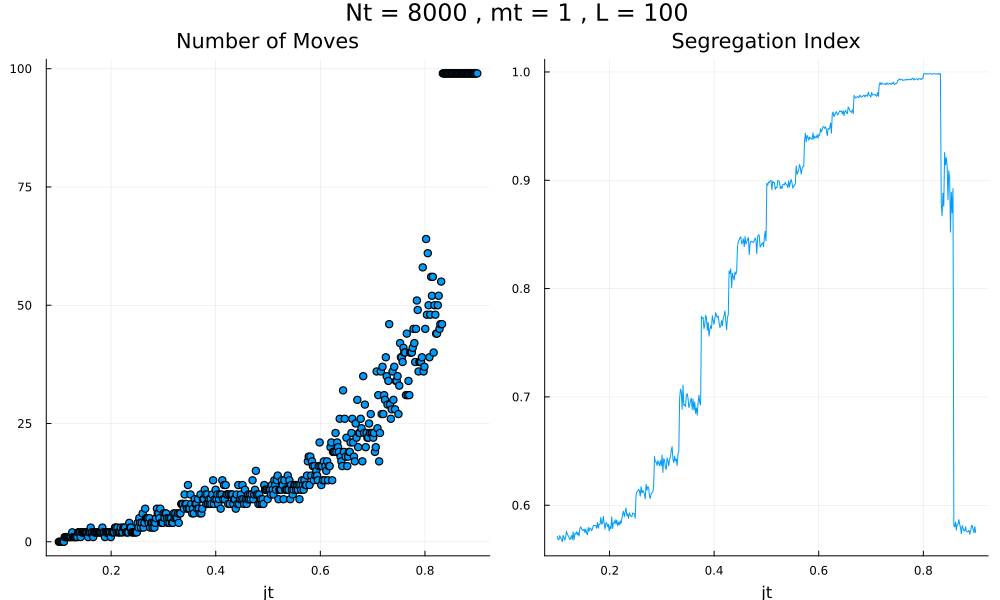

In [24]:
p1 = scatter(Jt , Mv , title = "Number of Moves" , label = false)
p2 = plot(Jt , Si , title = "Segregation Index", label = false)
plot(p1, p2, xlabel="jt" , suptitle ="Nt = 8000 , mt = $(mt) , L = $(L)", size = (1000 , 600))

In [16]:
Jt = range(0.1 , 0.9 , 500)
Si = zeros( length(Jt) )
Mv = zeros( length(Jt) )

Threads.@threads for q in eachindex(Jt)
    domain , moves , si = Segregation_Torus(nt , L , 4000 , 4000 , mt , Jt[q] , 1 - Jt[q])
    Si[q] = si
    Mv[q] = moves
end

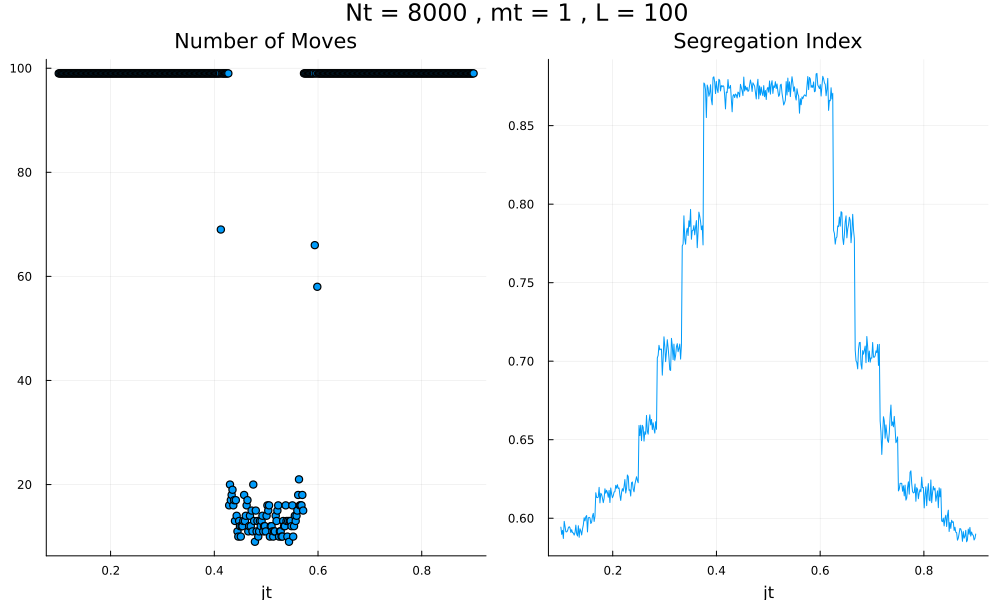

In [21]:
p1 = scatter(Jt , Mv , title = "Number of Moves" , label = false)
p2 = plot(Jt , Si , title = "Segregation Index", label = false)
plot(p1, p2, xlabel="jt" , suptitle ="Nt = 8000 , mt = $(mt) , L = $(L)", size = (1000 , 600))

In [3]:
L  = 100
nt = 100
Mt = [1,2,3,4,5,6]
jr = jb = .6

Si = zeros( length(Mt) )
Mv = zeros( length(Mt) )
Dm = zeros( Int , length(Mt) , nt , L , L )
Threads.@threads for q in eachindex(Mt)
    domain , moves , si = Segregation_Torus(nt , L , 4000 , 4000 , Mt[q] , jr , jb)
    Dm[q,:,:,:] = domain
    Si[q] = si
    Mv[q] = moves
end

┌ Info: Saved animation to /tmp/jl_pARavc32By.gif
└ @ Plots /home/lucas/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_pARavc32By.gif")
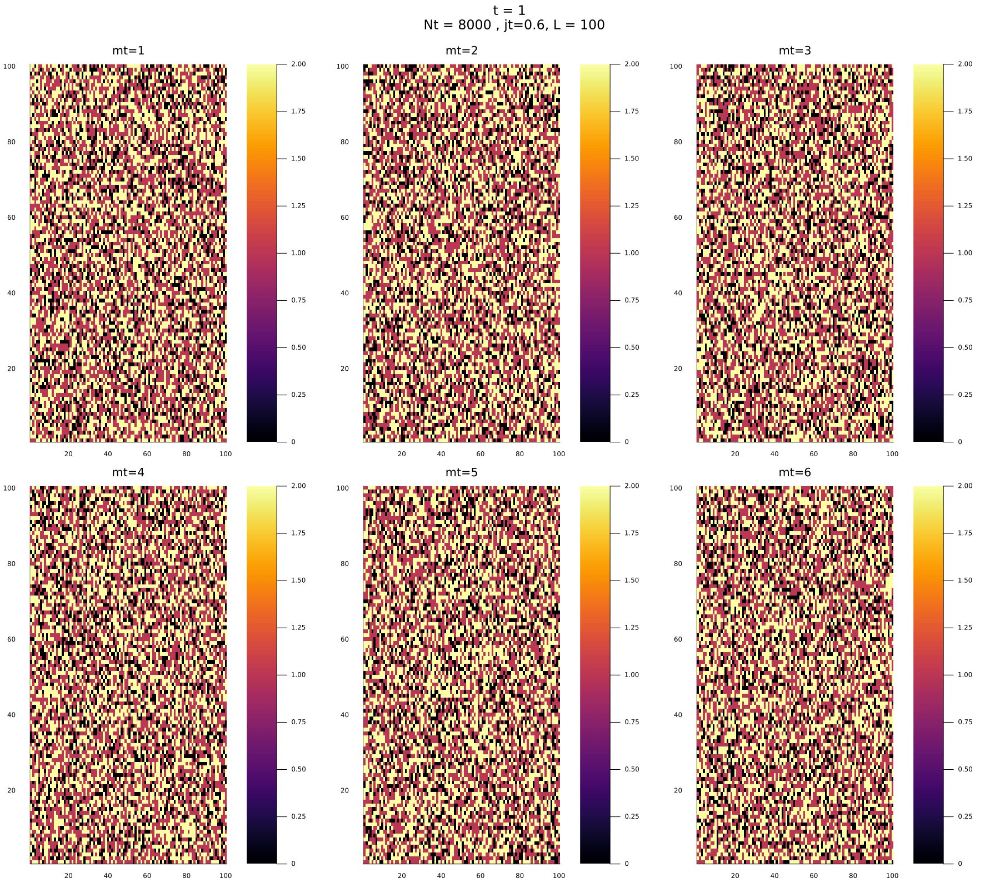

In [4]:
fig = @animate for q in 1:nt
    p1 = heatmap( Dm[1,q,:,:] , title = "mt=1" )
    p2 = heatmap( Dm[2,q,:,:] , title = "mt=2")
    p3 = heatmap( Dm[3,q,:,:] , title = "mt=3")
    p4 = heatmap( Dm[4,q,:,:] , title = "mt=4")
    p5 = heatmap( Dm[5,q,:,:] , title = "mt=5")
    p6 = heatmap( Dm[6,q,:,:] , title = "mt=6")
    plot(p1,p2,p3,p4,p5,p6, size = (1800 , 1600) , suptitle = "t = $(q) \n Nt = 8000 , jt=$(jr), L = $(L)")
end
gif(fig)

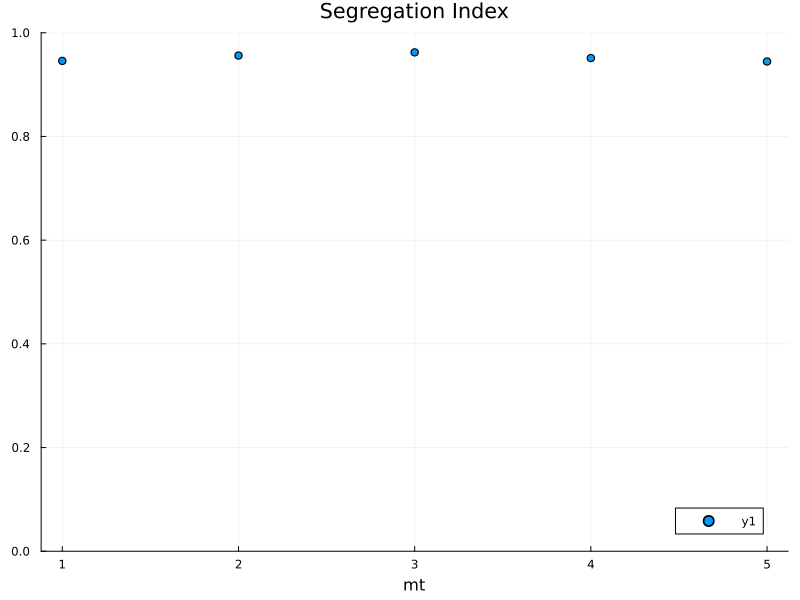

In [29]:
scatter( Mt , Si , ylims = (0,1) , size = (800,600) , xlabel = "mt" , title = "Segregation Index")

┌ Info: Saved animation to /tmp/jl_dQBI5yfIHK.gif
└ @ Plots /home/lucas/.julia/packages/Plots/Ec1L1/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_dQBI5yfIHK.gif")
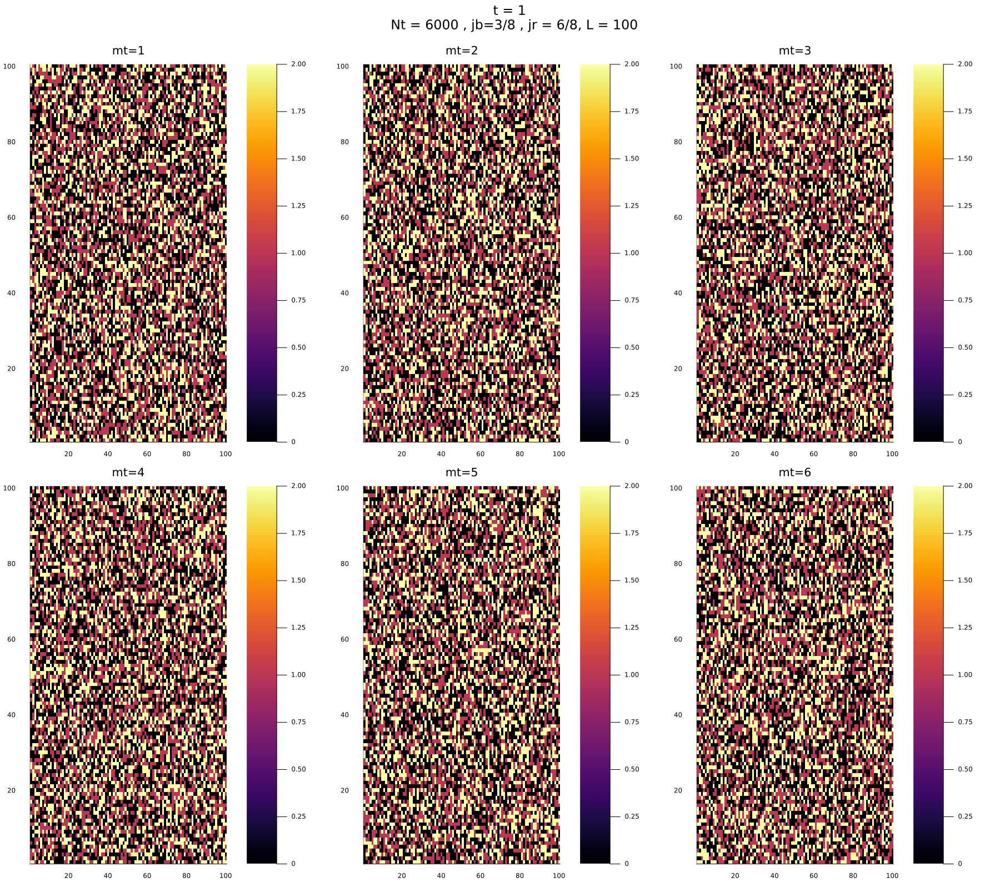

In [6]:
nt = 200
domain1 , moves1 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 1 ,6/8 , 3/8 )
domain2 , moves2 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 2 ,6/8 , 3/8 )
domain3 , moves3 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 3 ,6/8 , 3/8 )
domain4 , moves4 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 4 ,6/8 , 3/8 )
domain5 , moves5 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 5 ,6/8 , 3/8 )
domain6 , moves6 , si1 = Segregation_Torus(nt , L , 3000 , 3000 , 6 ,6/8 , 3/8 )

fig = @animate for q in 1:nt
    p1 = heatmap( domain1[q,:,:] , title = "mt=1" )
    p2 = heatmap( domain2[q,:,:] , title = "mt=2")
    p3 = heatmap( domain3[q,:,:] , title = "mt=3")
    p4 = heatmap( domain4[q,:,:] , title = "mt=4")
    p5 = heatmap( domain5[q,:,:] , title = "mt=5")
    p6 = heatmap( domain6[q,:,:] , title = "mt=6")
    plot(p1,p2,p3,p4,p5,p6, size = (1800 , 1600) , suptitle = "t = $(q) \n Nt = 6000 , jb=3/8 , jr = 6/8, L = $(L)")
end
gif(fig)